<a href="https://colab.research.google.com/github/sepehr21ar/Deep_Learning_Project/blob/main/EstakhtemoonNasheh_TF_exact_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!rm -rf /content/result.zip

# ========================
# نصب و ایمپورت‌ها
# ========================

In [ ]:

!pip -q install gdown
import math
import os, json, zipfile, glob
import gdown
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from tensorflow.keras import models, layers, regularizers, callbacks



# ========================
# دانلود و استخراج دیتاست
# ========================

In [ ]:

file_id = "1b8O_a6ywcsbLqJAGDGCkePrdn1cFlXl0"
destination = "dataset.zip"
gdown.download(f"https://drive.google.com/uc?id={file_id}", destination, quiet=False)

with zipfile.ZipFile(destination, "r") as z:
    z.extractall("dataset")

print("✅ Dataset downloaded & extracted")

base_path = "dataset"


Downloading...
From (original): https://drive.google.com/uc?id=1b8O_a6ywcsbLqJAGDGCkePrdn1cFlXl0
From (redirected): https://drive.google.com/uc?id=1b8O_a6ywcsbLqJAGDGCkePrdn1cFlXl0&confirm=t&uuid=4d0798af-c9a9-4739-a93c-4e50ebc341c2
To: /content/dataset.zip
100%|██████████| 4.06G/4.06G [00:51<00:00, 78.7MB/s]


✅ Dataset downloaded & extracted


*خواندن JSON ها*

In [ ]:

with open(os.path.join(base_path, "train.json"), "r", encoding="utf-8") as f:
    train_data = json.load(f)
with open(os.path.join(base_path, "test.json"), "r", encoding="utf-8") as f:
    test_data = json.load(f)

train_df = pd.DataFrame(train_data)
test_df  = pd.DataFrame(test_data)



*ساخت برچسب (label)*

In [ ]:

# label: استخر = 1، بدون استخر = 0
def make_label(rooms_obj):
    title = rooms_obj.get("title", "") if isinstance(rooms_obj, dict) else ""
    desc  = rooms_obj.get("description", "") if isinstance(rooms_obj, dict) else ""
    return int(("استخر" in title) or ("استخر" in desc))

train_df["label"] = train_df["rooms"].map(make_label)

print("ستون‌ها:", train_df.columns.tolist())



ستون‌ها: ['rooms', 'label']


*جمع‌آوری مسیر تصاویر برای هر آگهی*

In [ ]:

def collect_images(df, split, base_dir):
    """  df: دیتافریم شامل ستون 'rooms' که خودش dict با کلید 'id' است
    split: 'train' یا 'test'
    base_dir: مسیر روت دیتاست
    خروجی: دیتافریم با ستون‌های: id, images, (label اگر باشد)
    """
    rows = []
    for _, row in df.iterrows():
        rooms = row.get("rooms", {})
        room_id = rooms.get("id", None) if isinstance(rooms, dict) else None
        if room_id is None:
            continue

        room_dir = os.path.join(base_dir, split, str(room_id))
        imgs = []
        if os.path.exists(room_dir):
            # همه فایل‌های تصویری را بردار
            for fname in os.listdir(room_dir):
                if fname.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
                    imgs.append(os.path.join(room_dir, fname))

        if len(imgs) == 0:
            continue

        entry = {"id": room_id, "images": sorted(imgs)}
        if "label" in df.columns:
            entry["label"] = row["label"]
        rows.append(entry)

    return pd.DataFrame(rows)

train_images_df = collect_images(train_df, "train", base_path)
test_images_df  = collect_images(test_df,  "test",  base_path)

print(f"تعداد آگهی‌های دارای تصویر (train): {len(train_images_df)}")
print(f"تعداد آگهی‌های دارای تصویر (test):  {len(test_images_df)}")


تعداد آگهی‌های دارای تصویر (train): 1599
تعداد آگهی‌های دارای تصویر (test):  861


*گسترش دیتافریم به سطرهای تک‌تصویری برای آموزش*

In [ ]:
def expand_to_single_image_rows(df_with_lists):
    """
    ورودی: دیتافریم با ستون 'images' (لیست مسیرها) و 'label' (در train)
    خروجی: دیتافریم با ستون‌های image_path, label
    """
    rows = []
    for _, r in df_with_lists.iterrows():
        label = r.get("label", None)
        for p in r["images"]:
            rows.append({"image_path": p, "label": label})
    return pd.DataFrame(rows)

train_expanded = expand_to_single_image_rows(train_images_df)

# اسپلینت train/val
train_split, val_split = train_test_split(
    train_expanded, test_size=0.2, random_state=42, stratify=train_expanded["label"]
)


*تنظیمات تصویر و توابع لود*

In [ ]:
IMG_SIZE = (128, 128)

def load_image_tf(path):
    img = tf.io.read_file(path)
    # decode_image فرمت را اتومات تشخیص می‌دهد و شکل را تعیین می‌کند
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    return img


*ساخت tf.data.Dataset ها*

In [ ]:
def make_dataset(df, training=False, batch_size=32):
    """
    df: باید ستون 'image_path' و برای آموزش 'label' داشته باشد
    """
    paths = df["image_path"].values
    if "label" in df.columns and df["label"].notna().all():
        labels = df["label"].astype("float32").values
        ds = tf.data.Dataset.from_tensor_slices((paths, labels))

        def _map(path, label):
            img = load_image_tf(path)
            return img, tf.cast(label, tf.float32)

        ds = ds.map(_map, num_parallel_calls=tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices(paths)
        ds = ds.map(load_image_tf, num_parallel_calls=tf.data.AUTOTUNE)

    if training:
        ds = ds.shuffle(1024, reshuffle_each_iteration=True)

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_split, training=True,  batch_size=32)
val_ds   = make_dataset(val_split,   training=False, batch_size=32)


# ========================
# ویژوالایزیشن (قبل از آموزش)
# نمایش چند تصویر از یک id خاص یا به‌صورت تصادفی
# ========================

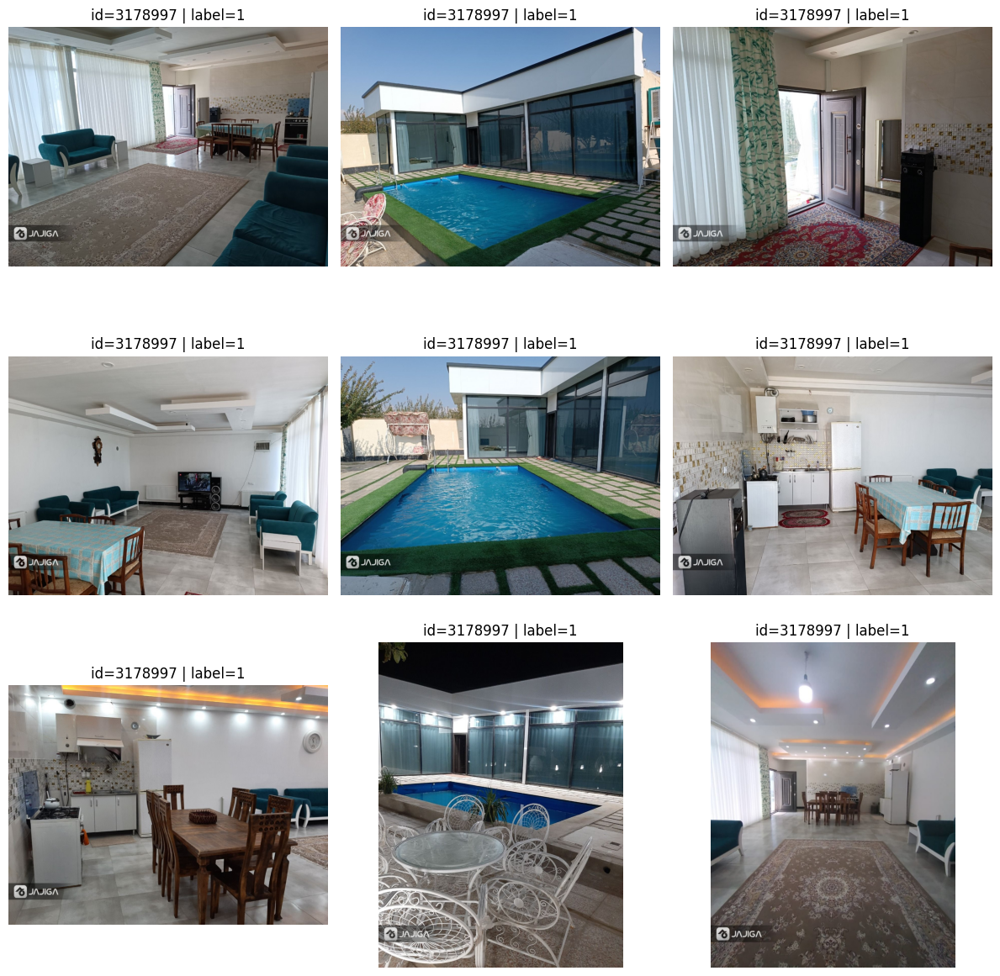

In [ ]:


import random

def show_room_images(room_id=None, num=9):
    """
    اگر room_id ندهی، یک آگهی تصادفی از train_images_df نمایش می‌دهد.
    """
    df_src = train_images_df
    if room_id is None:
        row = df_src.sample(1, random_state=random.randint(0, 9999)).iloc[0]
    else:
        row = df_src[df_src["id"] == room_id].iloc[0]

    imgs = row["images"][:num]
    n = min(len(imgs), num)
    cols = 3
    rows = int(np.ceil(n / cols))
    plt.figure(figsize=(12, 4 * rows))
    for i, p in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        img = tf.keras.utils.load_img(p)
        plt.imshow(img)
        plt.title(f"id={row['id']} | label={row.get('label','?')}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# مثال نمایش:
show_room_images()  # می‌تونی room_id مشخص کنی: show_room_images(12345)


In [ ]:
# از train_split که قبل از batch ساخته شده
y_train = train_split["label"].values
y_val   = val_split["label"].values

print("y_train shape:", y_train.shape)
print("unique labels:", np.unique(y_train))


y_train shape: (12672,)
unique labels: [0 1]


# ========================
#Model
# ========================

In [ ]:
BATCH_SIZE = 32

def build_model():
    inputs = layers.Input(shape=(*IMG_SIZE, 3))

    x = layers.Conv2D(32, 3, activation="relu", padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.2)(x)

    x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Conv2D(512, 3, activation="relu", padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.5)(x)

    outputs = layers.Dense(1, activation="sigmoid")(x)  # خروجی باینری
    model = models.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss="binary_crossentropy",
        metrics=["accuracy", tf.keras.metrics.AUC(name="auc")]
    )
    return model

model = build_model()


*Train*

In [ ]:

# ✅ Callbacks
early_stop = callbacks.EarlyStopping(
    monitor="val_loss", patience=8, restore_best_weights=True
)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor="val_loss", factor=0.02, patience=4, min_lr=1e-6, verbose=1
)

checkpoint = callbacks.ModelCheckpoint(
    "best_tf_model.keras", monitor="val_loss",
    save_best_only=True, verbose=1
)

# 🚀 آموزش اصلی
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

# ✅ بارگذاری بهترین مدل
if os.path.exists("best_tf_model.keras"):
    model = models.load_model("best_tf_model.keras")

# 🎯 محاسبه F1 روی ولیدیشن
y_true, y_pred = [], []
for imgs, labels in val_ds:
    preds = model.predict(imgs, verbose=0)
    if preds.shape[1] == 2:  # softmax دوکلاسی
        preds = np.argmax(preds, axis=1)
    else:  # sigmoid باینری
        preds = (preds.flatten() > 0.5).astype(int)
    y_true.extend(labels.numpy().astype(int).tolist())
    y_pred.extend(preds.tolist())

f1 = f1_score(y_true, y_pred)
print(f"✅ Best Validation F1: {f1:.4f}")

Epoch 1/50
396/396 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.5973 - auc: 0.6388 - loss: 0.6656
Epoch 1: val_loss improved from inf to 1.62445, saving model to best_tf_model.keras
396/396 ━━━━━━━━━━━━━━━━━━━━ 99s 180ms/step - accuracy: 0.5974 - auc: 0.6389 - loss: 0.6656 - val_accuracy: 0.4913 - val_auc: 0.6741 - val_loss: 1.6245 - learning_rate: 1.0000e-04
Epoch 2/50
396/396 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.6579 - auc: 0.7166 - loss: 0.6198
Epoch 2: val_loss improved from 1.62445 to 1.38113, saving model to best_tf_model.keras
396/396 ━━━━━━━━━━━━━━━━━━━━ 76s 182ms/step - accuracy: 0.6579 - auc: 0.7166 - loss: 0.6198 - val_accuracy: 0.5052 - val_auc: 0.7221 - val_loss: 1.3811 - learning_rate: 1.0000e-04
Epoch 3/50
396/396 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.6725 - auc: 0.7343 - loss: 0.6060
Epoch 3: val_loss improved from 1.38113 to 1.06608, saving model to best_tf_model.keras
396/396 ━━━━━━━━━━━━━━━━━━━━ 65s 156ms/step - accuracy: 0.6725 - auc: 0.73

# ========================
#Predict
# ========================

In [ ]:
def predict_with_polling(model, images_df, threshold=0.5):
    """
    هر آگهی را بررسی می‌کنیم؛
    اگر حداقل یک تصویر احتمال Pool >= threshold داشت، کل آگهی Pool در نظر گرفته می‌شود.
    خروجی: (list of ids, list of bool)
    """
    ids = []
    poll_labels = []

    for _, row in images_df.iterrows():
        room_id = row["id"]
        paths = row["images"]
        if len(paths) == 0:
            # اگر تصویر وجود نداشت → False
            ids.append(room_id)
            poll_labels.append(False)
            continue

        # پیش‌بینی هر تصویر
        is_pool = False
        for p in paths:
            img = tf.keras.utils.load_img(p, target_size=IMG_SIZE)
            img = tf.keras.utils.img_to_array(img) / 255.0
            img = np.expand_dims(img, axis=0)
            prob = float(model.predict(img, verbose=0).flatten()[0])
            if prob >= threshold:
                is_pool = True
                break  # همین که یکی Pool شد، کافی است

        ids.append(room_id)
        poll_labels.append(is_pool)

    return ids, poll_labels


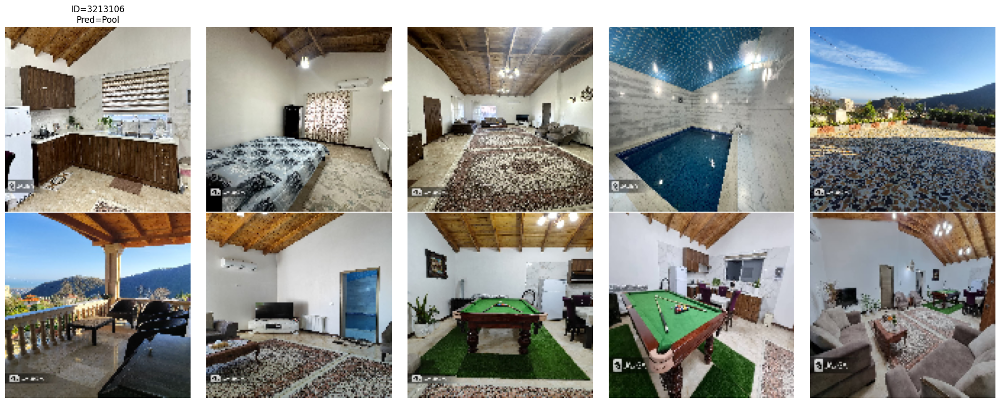

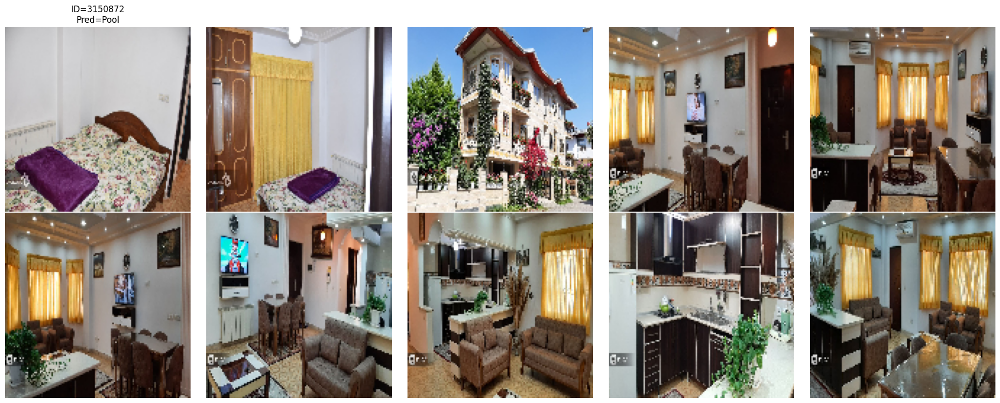

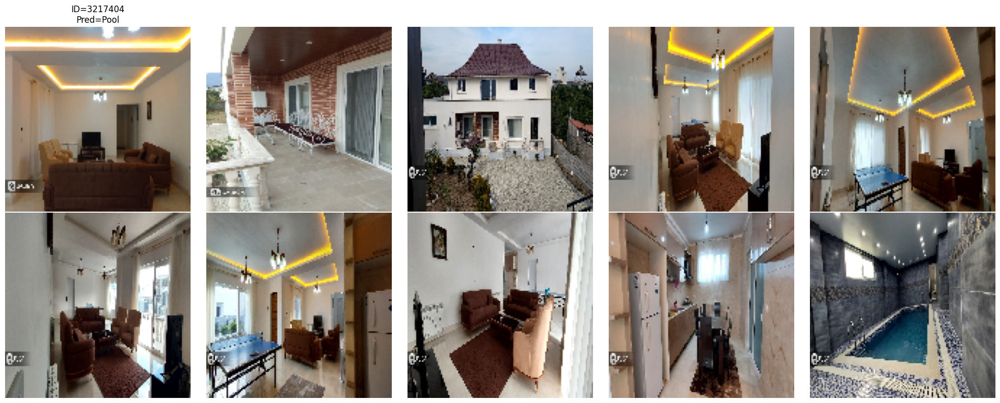

In [ ]:

# ========================
# تابع visualization با polling
# ========================
def visualize_test_predictions_polling(model, num_rooms=3, threshold=0.5):
    """
    نمایش چند آگهی تست با polling.
    اگر حداقل یک تصویر Pool باشد، کل room Pool در نظر گرفته می‌شود.
    """
    sample_rooms = test_images_df.sample(num_rooms, random_state=random.randint(0, 9999))

    for _, row in sample_rooms.iterrows():
        room_id = row["id"]
        paths = row["images"]
        if len(paths) == 0:
            continue

        # بررسی polling
        any_pool = False
        for p in paths:
            img = tf.keras.utils.load_img(p, target_size=IMG_SIZE)
            img_arr = tf.keras.utils.img_to_array(img) / 255.0
            img_arr = np.expand_dims(img_arr, axis=0)
            prob = model.predict(img_arr, verbose=0).flatten()[0]
            if prob >= threshold:
                any_pool = True
                break
        pred_label = "Pool" if any_pool else "No Pool"

        # نمایش تصاویر
        n = len(paths)
        cols = 5
        rows = math.ceil(n / cols)
        plt.figure(figsize=(4*cols, 4*rows))
        for i, p in enumerate(paths):
            plt.subplot(rows, cols, i+1)
            img = tf.keras.utils.load_img(p, target_size=IMG_SIZE)
            plt.imshow(img)
            plt.axis("off")
            if i == 0:
                plt.title(f"ID={room_id}\nPred={pred_label}", fontsize=12)
        plt.tight_layout()
        plt.show()

# مثال اجرا
visualize_test_predictions_polling(model, num_rooms=3)

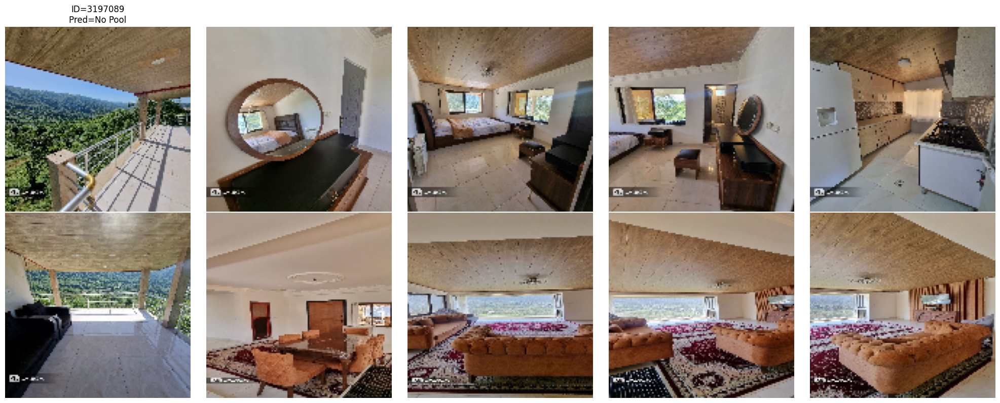

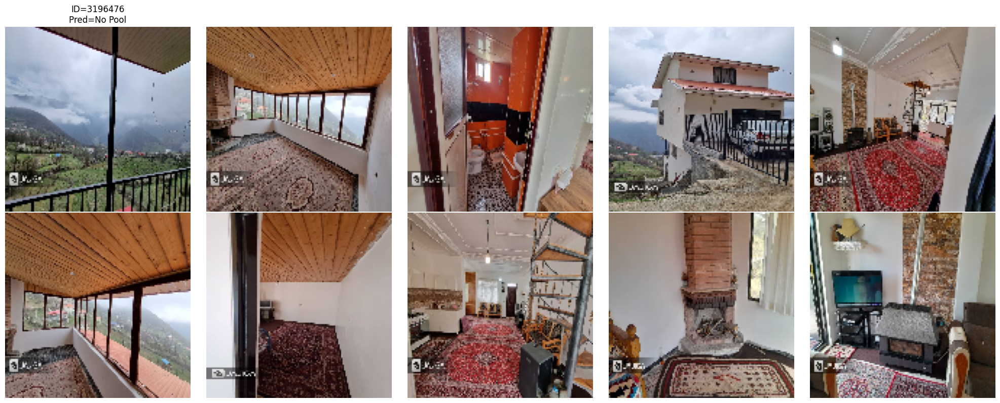

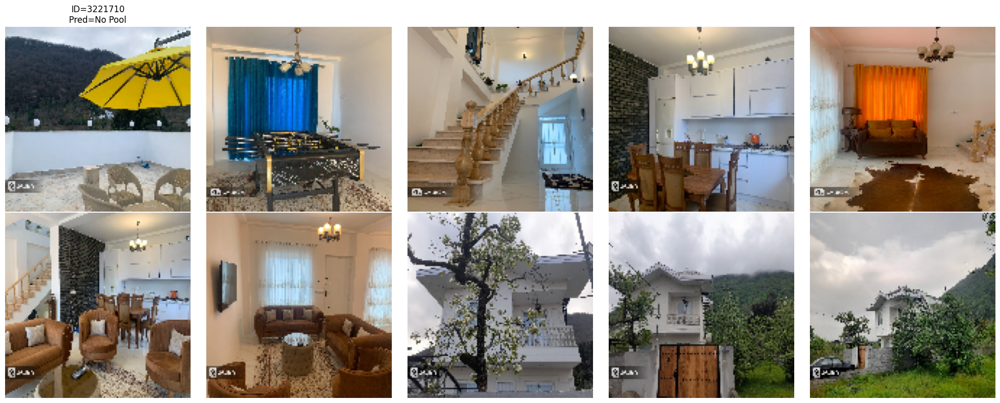

In [ ]:
def visualize_no_pool(model, num_rooms=3, threshold=0.5):
    """
    نمایش فقط آگهی‌های No Pool
    """
    # فیلتر کردن آگهی‌های No Pool
    no_pool_df = []
    for _, row in test_images_df.iterrows():
        paths = row["images"]
        if len(paths) == 0:
            no_pool_df.append(row)
            continue
        any_pool = False
        for p in paths:
            img = tf.keras.utils.load_img(p, target_size=IMG_SIZE)
            img_arr = tf.keras.utils.img_to_array(img) / 255.0
            img_arr = np.expand_dims(img_arr, axis=0)
            prob = model.predict(img_arr, verbose=0).flatten()[0]
            if prob >= threshold:
                any_pool = True
                break
        if not any_pool:
            no_pool_df.append(row)

    # نمونه‌گیری تصادفی
    sample_rooms = pd.DataFrame(no_pool_df).sample(min(num_rooms, len(no_pool_df)), random_state=random.randint(0, 9999))

    # نمایش تصاویر
    for _, row in sample_rooms.iterrows():
        room_id = row["id"]
        paths = row["images"]
        n = len(paths)
        cols = 5
        rows = math.ceil(n / cols)
        plt.figure(figsize=(4*cols, 4*rows))
        for i, p in enumerate(paths):
            plt.subplot(rows, cols, i+1)
            img = tf.keras.utils.load_img(p, target_size=IMG_SIZE)
            plt.imshow(img)
            plt.axis("off")
            if i == 0:
                plt.title(f"ID={room_id}\nPred=No Pool", fontsize=12)
        plt.tight_layout()
        plt.show()

# مثال اجرا
visualize_no_pool(model, num_rooms=3)


 # *make predict file*

In [ ]:

test_ids_poll, test_pred_poll = predict_with_polling(model, test_images_df, threshold=0.5)

submission_poll = pd.DataFrame({"id": test_ids_poll, "pool": test_pred_poll})
submission_poll.to_csv("submission.csv", index=False)
print("✅ submission.csv ذخیره شد")
submission_poll.head()


✅ submission.csv ذخیره شد


,id,pool
0,3160664,True
1,3195184,True
2,3224078,True
3,3233712,True
4,3201449,True


## Save outputs and zip

In [ ]:
import zipfile
def compress(file_names, zip_name='result.zip'):
    with zipfile.ZipFile(zip_name, mode='w') as zf:
        for fn in file_names:
            if os.path.exists(fn):
                if os.path.isdir(fn):

                    for root, dirs, files in os.walk(fn):
                        for f in files:
                            full = os.path.join(root, f)
                            arc = os.path.relpath(full, start=os.path.dirname(fn))
                            zf.write(full, arc)
                else:
                    zf.write(fn)
    print('Zipped to', zip_name)

file_names = ['submission.csv', 'EstakhtemoonNasheh_TF_exact_v2.ipynb']
compress(file_names)

Zipped to result.zip
